In [1]:
import pandas as pd
import ast
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
output = pd.read_csv('output.csv', converters={4:ast.literal_eval,5:ast.literal_eval})

In [29]:
output.head()

,band_name,node_count,edge_count,ave_clustering,betweenness,nodes1
0,Deerhunter,20,20,0.101786,"{'Deerhunter': 0.7777777777777777, 'Lotus Plaz...","[Deerhunter, Lotus Plaza, Black Lips, Stereola..."
1,The Cure,152,182,0.170763,"{'The Cure': 0.8324150110375275, 'Siouxsie and...","[The Cure, Siouxsie and the Banshees, the Glov..."
2,Yeah Yeah Yeahs,93,126,0.229509,"{'Yeah Yeah Yeahs': 0.6791686574295269, 'Nativ...","[Yeah Yeah Yeahs, Native Korean Rock, Swans, H..."
3,Dirty Projectors,211,238,0.109498,"{'Dirty Projectors': 0.731829573934837, 'Vampi...","[Dirty Projectors, Vampire Weekend, Discovery,..."
4,Richard Hawley,25,25,0.080261,"{'Richard Hawley': 0.40942028985507245, 'Longp...","[Richard Hawley, Longpigs, Pulp, Arctic Monkeys]"


In [58]:
output.shape

(90, 6)

In [4]:
deerhunter_df = output[output.band_name==('Deerhunter')]

In [5]:
dh_name = deerhunter_df.band_name[0]
dh_nodec = deerhunter_df.node_count[0]
dh_edgec = deerhunter_df.edge_count[0]
dh_between = deerhunter_df.betweenness[0]
dh_nodes1 = deerhunter_df.nodes1[0]

In [6]:
bands = pd.DataFrame.from_dict(dh_between,orient='Index').reset_index()
bands.columns = ['band','betweenness']

In [38]:
list(output[output.band_name==('The Cure')].band_name)[0]

'The Cure'

In [82]:
def draw_betweenness(band):
    band_df = output[output.band_name==(band)]
    band_name = list(band_df.band_name)[0]
    band_nodec = list(band_df.node_count)[0]
    band_edgec = list(band_df.edge_count)[0]
    band_between = list(band_df.betweenness)[0]
    band_nodes1 = list(band_df.nodes1)[0]
    bands = pd.DataFrame.from_dict(band_between,orient='Index').reset_index()
    bands.columns = ['band','betweenness']

#     fig_height

    plot_df = bands.sort_values('betweenness')[bands.betweenness>0]
    fig_height = plot_df.shape[0]
    
    fig, ax = plt.subplots(figsize=(10,fig_height))
    plt.ioff()

    color_list = plot_df.band.map(lambda x: '#708090' if x==band_name else '#7a977a' if x in band_nodes1 else '#707070')

    plot_df.betweenness.plot(kind='barh', color=color_list)

    ax.set_yticklabels(plot_df.band, fontdict={'fontweight':'bold'})

    ax.tick_params(colors='white')
    ax.set_axis_bgcolor('#00000F')
    ax.xaxis.grid(False)
    ax.yaxis.grid(False)

    fig.set_facecolor("#00000F")

    title_text = '\n'.join(['',
                            band_name,
                            'Number of bands: {}'.format(band_nodec),
                            'Number of links: {}'.format(band_edgec),
                            'Central bands in network:',''])

    plt.title(title_text,color='white',weight='bold',loc='left')
    
    plt.savefig('btwn_output/'+band_name.lower().replace(' ','-')+'-btwn.png',
                facecolor='#00000F',
                bbox_inches=None,
                pad_inches=0)
#     plt.show();

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:25: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.


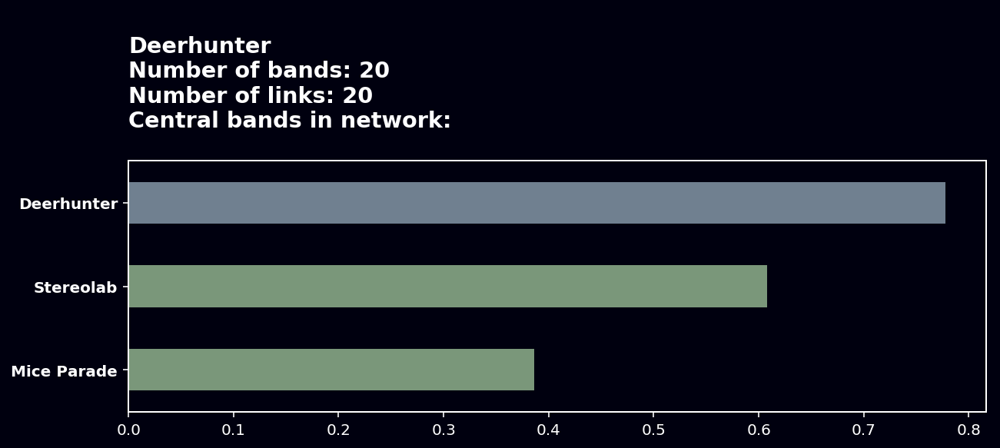

In [77]:
draw_betweenness('Deerhunter')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.


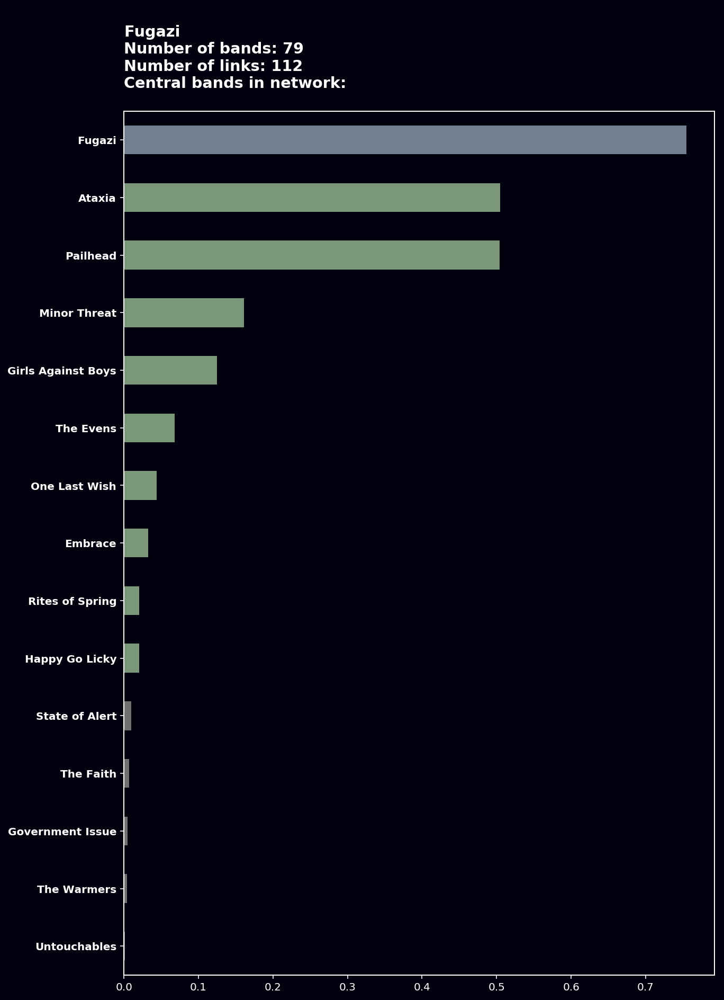

In [83]:
draw_betweenness('Fugazi')

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: The set_axis_bgcolor function was deprecated in version 2.0. Use set_facecolor instead.
/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


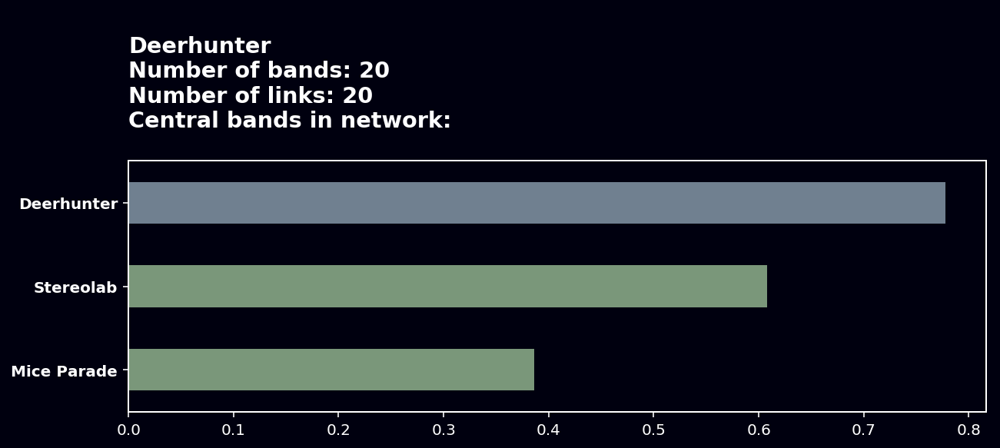

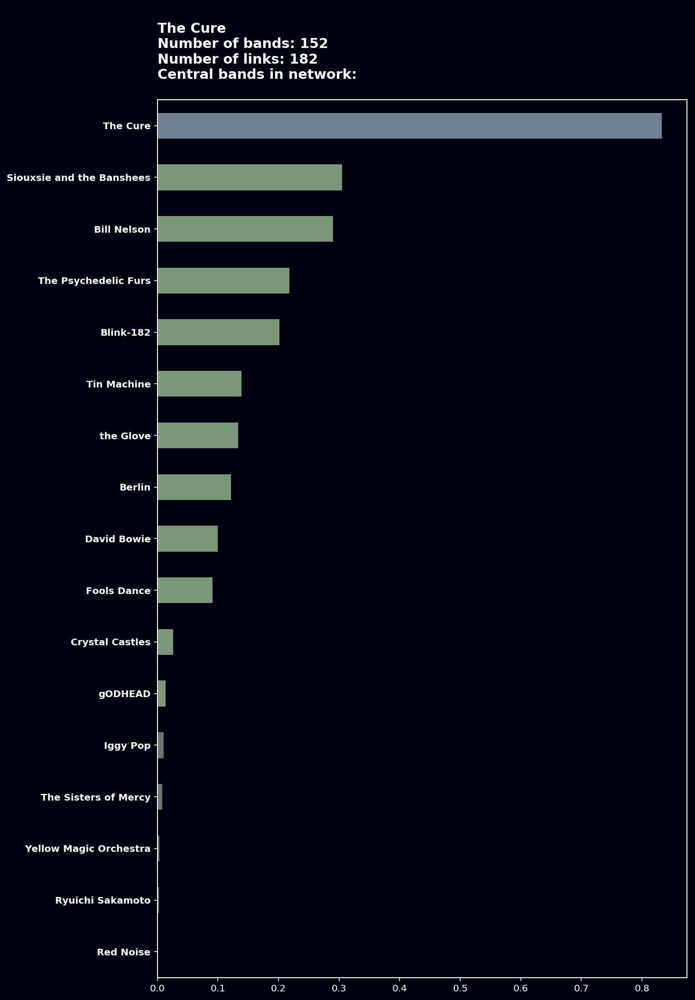

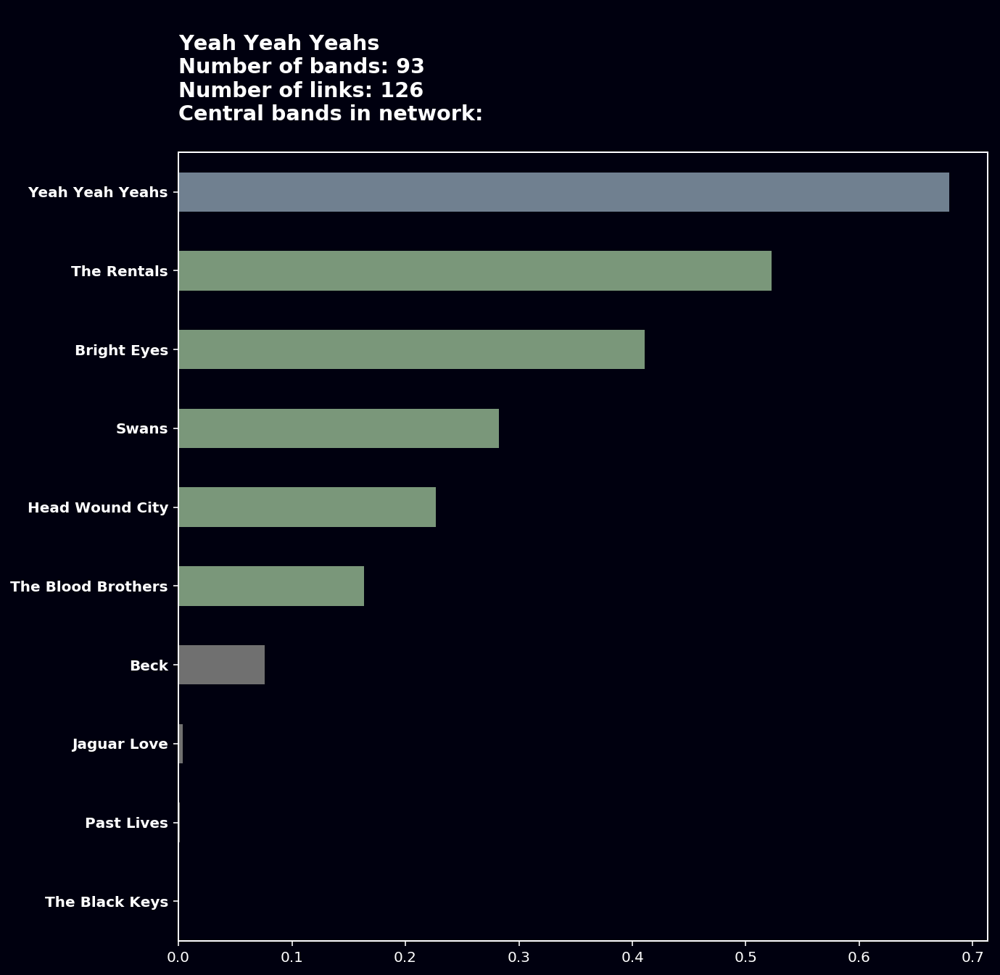

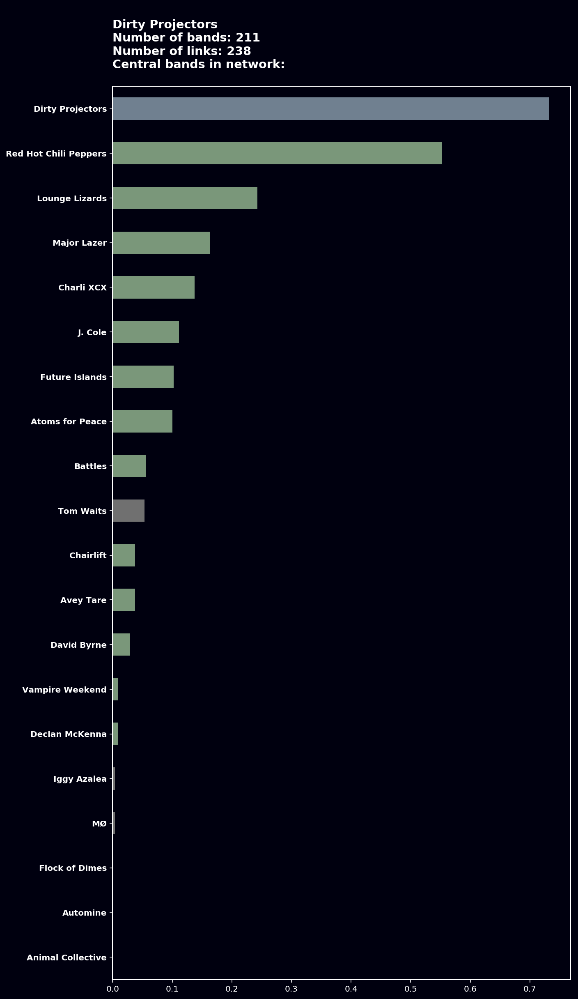

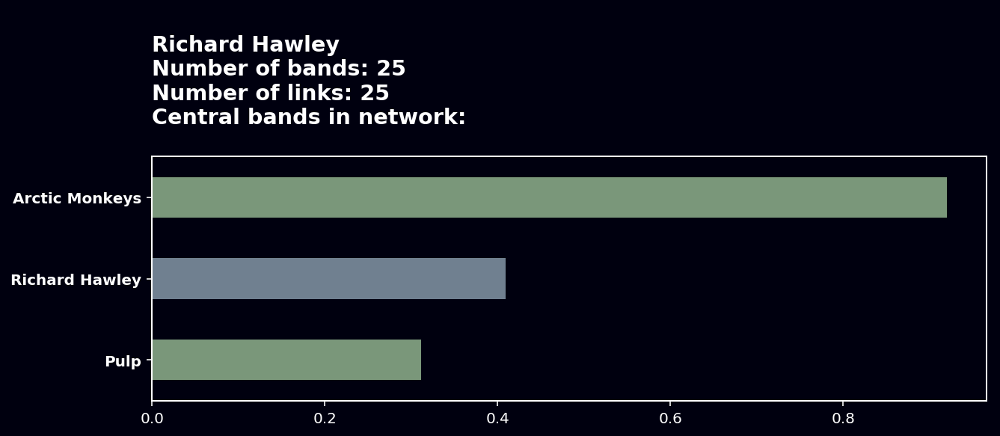

...

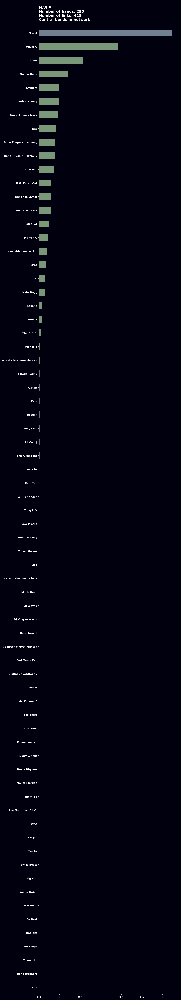

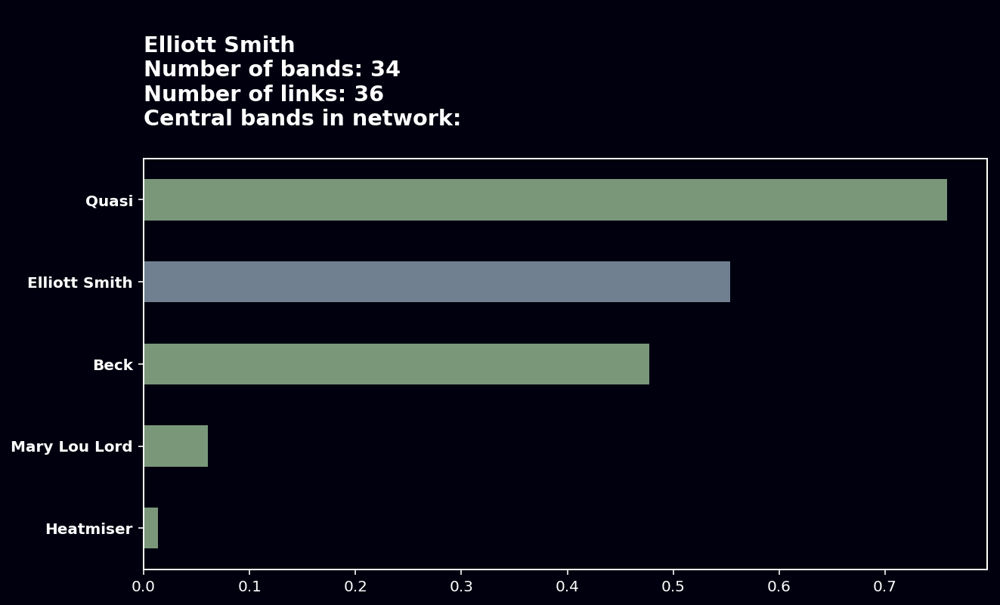

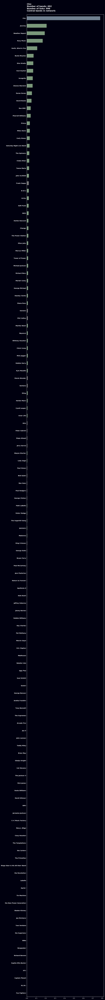

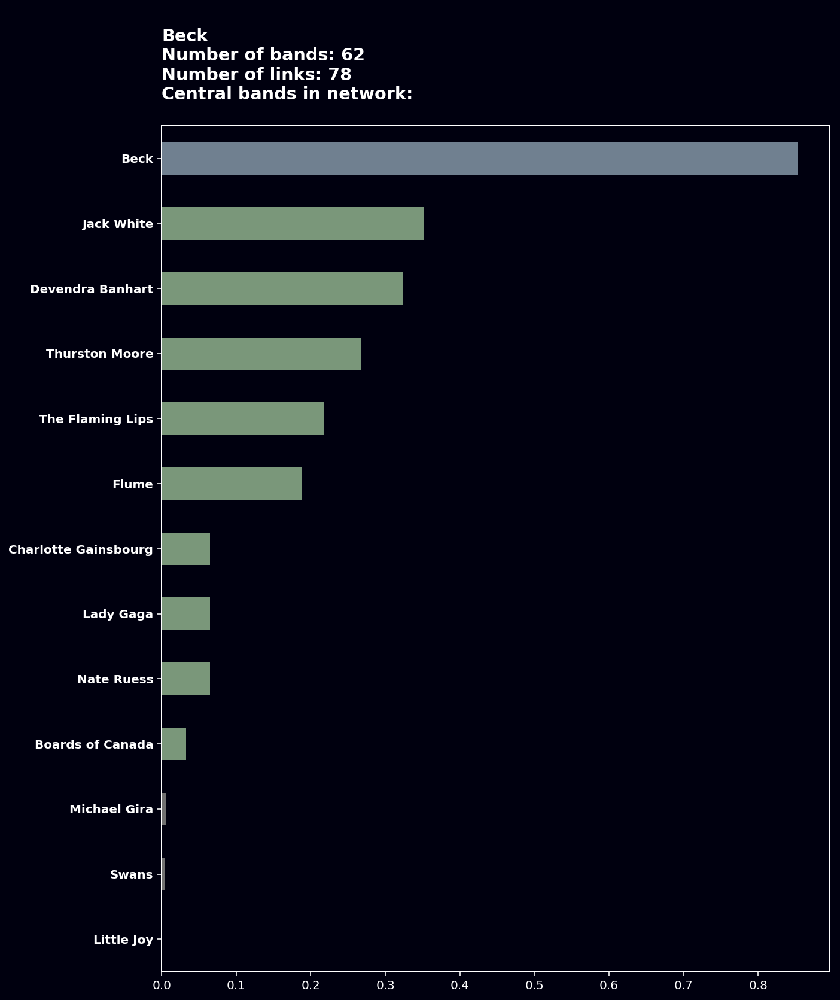

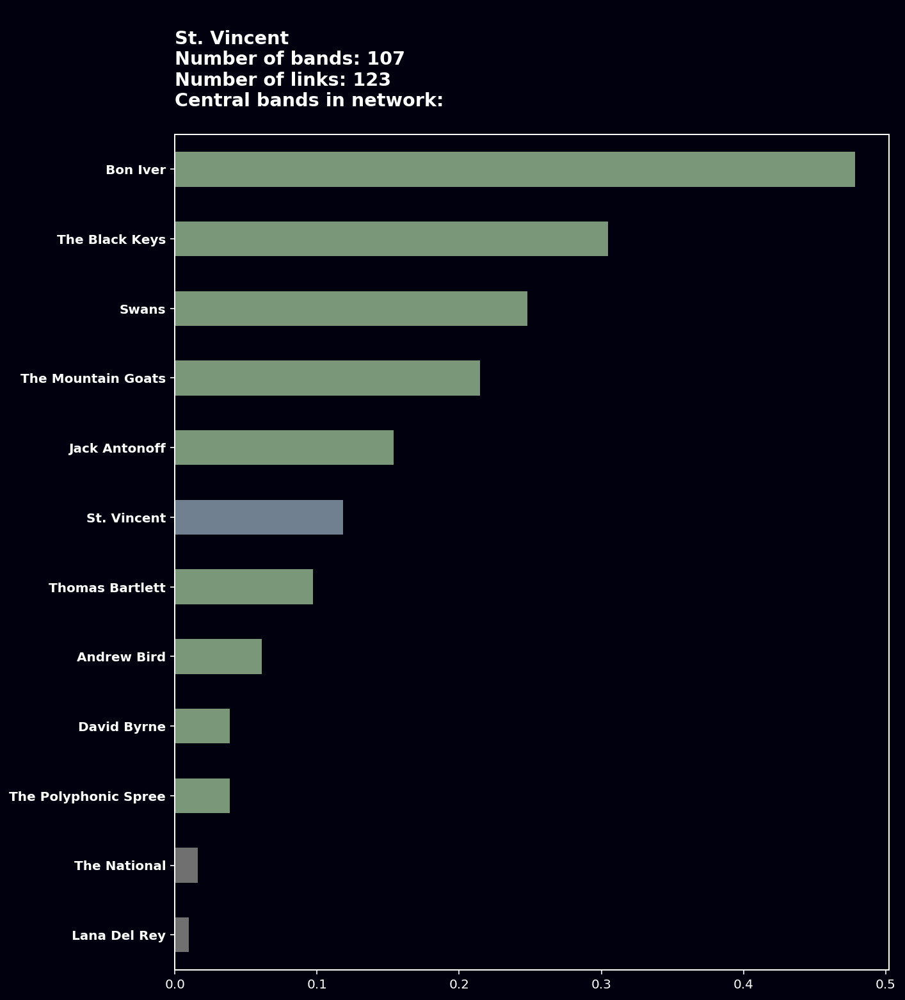

In [85]:
for band in output.band_name:
    draw_betweenness(band)